<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Project: Analysis of CVs from HeadHunter
   

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots


from lib.find_outliers_functions import find_z_score_parameters
from lib.find_outliers_functions import outliers_z_score_mod


/var/folders/sf/83dwp_ds2sdd7m59tbgj21kr0000gn/T/ipykernel_27978/375520258.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


# Basic analysis of data structure:

1. Read the data from hh.ru using the Pandas library. 

In [2]:
hh_data = pd.read_csv('data/dst-3.0_16_1_hh_database.csv', sep=';')

2. Display a few initial (final) rows of the table to ensure that your data is intact. Familiarize yourself with the features and their structure.

In [3]:
display(hh_data.head())
display(hh_data.tail())

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано
3,"Мужчина , 38 лет , родился 25 июня 1980",100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,Высшее образование 2002 Саратовский государст...,08.04.2019 14:23,Не указано
4,"Женщина , 26 лет , родилась 3 марта 1993",140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,Высшее образование 2015 Кгу Психологии и педаг...,22.04.2019 10:32,Не указано


,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
44739,"Мужчина , 30 лет , родился 17 января 1989",50000 руб.,"Финансист, аналитик, экономист, бухгалтер, мен...","Тверь , готов к переезду (Москва, Химки) , гот...",полная занятость,"полный день, удаленная работа","Опыт работы 7 лет 7 месяцев Финансист, аналит...","ООО ""IAS"" (независимый участник объединения Ru...",Руководитель субгруппы,Высшее образование 2015 Московский гуманитарн...,22.04.2019 12:32,Не указано
44740,"Мужчина , 27 лет , родился 5 марта 1992",39000 руб.,"Системный администратор, IT-специалист","Липецк , готов к переезду , готов к командировкам","проектная работа, частичная занятость, полная ...","удаленная работа, гибкий график, полный день, ...","Опыт работы 7 лет Системный администратор, IT...",ИП Пестрецов,Предприниматель,Высшее образование (Бакалавр) 2016 Воронежски...,22.04.2019 13:11,Не указано
44741,"Женщина , 48 лет , родилась 26 декабря 1970",40000 руб.,"Аналитик данных, Математик","Челябинск , готова к переезду , готова к редки...",полная занятость,"полный день, удаленная работа",Опыт работы 21 год 5 месяцев Январь 1998 — по...,"ОАО «ЧМК», Исследовательско-Технологический Це...",Начальник группы аналитики,Высшее образование 2000 Южно-Уральский госуда...,09.04.2019 05:07,Не указано
44742,"Мужчина , 24 года , родился 6 октября 1994",20000 руб.,Контент-менеджер,"Тамбов , не готов к переезду , не готов к кома...","частичная занятость, полная занятость",удаленная работа,Опыт работы 3 года 10 месяцев Контент-менедже...,IQ-Maxima,Менеджер проектов,Высшее образование 2015 Тамбовский государств...,26.04.2019 14:25,Имеется собственный автомобиль
44743,"Мужчина , 38 лет , родился 25 апреля 1980",120000 руб.,Руководитель проекта,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 15 лет 10 месяцев Руководитель пр...,ПАО ГК ТНС энерго,Руководитель отдела технической поддержки,Высшее образование 1997 Южно-Российский госуд...,05.07.2018 20:15,Не указано


3. Basic information about the number of non-null values in the columns and their types in the table.

In [4]:
hh_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

4. The information about the number of non-null values.

In [5]:
hh_data.isnull().sum()

Пол, возраст                         0
ЗП                                   0
Ищет работу на должность:            0
Город, переезд, командировки         0
Занятость                            0
График                               0
Опыт работы                        168
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Образование и ВУЗ                    0
Обновление резюме                    0
Авто                                 0
dtype: int64

5. Basic statistical information about the columns.

In [6]:
hh_data.describe()

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 1987 Военный инженерный Кра...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Data Transformation

1. We will start with **"Образование и ВУЗ" (Education & University)** feature. Current format: **<Уровень образования год выпуска ВУЗ специальность...> (Education level graduation year University specialty...)**. Ex.:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
For the analysis we only need the Education level.

We will create a new feature **"Education"** using a transformation function, which should have 4 categories: "высшее", "неоконченное высшее", "среднее специальное" and "среднее" ("higher", "incomplete higher", "vocational secondary", and "secondary").

Afterwards we will delete "Образование и ВУЗ" feature.

_Note: In the feature the education level is within the first two words and starts with a capital letter._ 


In [7]:
# function to get the education level out of the education information column
def get_education_level(str):
    
    dict = {
        'Высшее образование': 'высшее', 
        'Неоконченное высшее': 'неоконченное высшее', 
        'Среднее специальное':'среднее специальное',
        'Среднее образование':'среднее'}
    
    return dict.get(' '.join(str.split()[:2]))
    

# create a new feature 'Уровень образования' (Education level) and delete 'Образование и ВУЗ' (Education & University) 
hh_data['Уровень образования'] = hh_data['Образование и ВУЗ'].apply(get_education_level)
hh_data.drop('Образование и ВУЗ', axis=1, inplace=True)

# check values in 'Уровень образования' (Education level) 
hh_data['Уровень образования'].value_counts()

Уровень образования
высшее                 33863
среднее специальное     5765
неоконченное высшее     4557
среднее                  559
Name: count, dtype: int64

2. Now let's work with  **"Пол, возраст" (Gender, age)**. The current format is  **<Пол , возраст , дата рождения > (Gender, age, DOB)**. Ex:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000

We will create two new features **"Пол" (Gender)** and **"Возраст" (Age)** as follows:
* Gender values are: 'М' - male, 'Ж' - female. 
* Age is an integer.

Then we will delete **"Пол, возраст" (Gender, age)** feature.

_Note: Parameters of gender, age, and date of birth are separated from each other - by the symbol ' , '. It is guaranteed that the structure is the same for all rows in the table._

In [8]:
# function to get gender and age out of gender-age-DOB string
def get_gender_age(str):
    
    gender = 'М' if str.split(',')[0].strip() == 'Мужчина' else 'Ж'
    age = int(str.split(',')[1].split()[0])
     
    return gender, age

# create two new features "Пол" (Gender) and "Возраст" (Age) and delete "Пол, возраст" (Gender, age)
hh_data[['Пол', 'Возраст']] = hh_data['Пол, возраст'].apply(lambda x: pd.Series(get_gender_age(x)))
hh_data.drop('Пол, возраст', axis=1, inplace=True)
hh_data.head()

# female applicants % rounded .00
print(f'Female applicants %: {round(hh_data['Пол'].value_counts(normalize=True)['Ж'] * 100, 2)}')

# average candidate age rounded .00
print(f'Mean age applicants: {round(hh_data['Возраст'].mean(), 2)}')


Female applicants %: 19.07
Mean age applicants: 32.2


3. Further on, we will transform feature **"Опыт работы" (Work experience)**. Current format: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…> (Work experience n years m month details)** to get total work experience in months 'Опыт работы (месяц)' (Work experience (month)). 

Requirements:
* for missing data return NaN
* for 'не указано' (not given) return NaN

After the transformation we will delete **"Опыт работы" (Work experience)** feature.


In [9]:
# function to get total work experience in months from 'Опыт работы' (Work experience) column
def get_work_experience_month(str):
    
    # return NaN for missing data
    if pd.isnull(str) or str == 'Не указано': # for some reason <if not str> instead of <if pd.isnull(str)> gets an error
        return np.NaN

    else:
        year = ['лет', 'год', 'года']
        month = ['месяц', 'месяца', 'месяцев']
    
        # get list of strings describing work experience
        exp_lst = str.split('  ')[0].split(' ')
    
        # run through items in work experience list adding values to exp variable
        exp = 0
        for i in range(len(exp_lst)-1):
            if exp_lst[i+1] in year:
                exp += int(exp_lst[i])*12
            elif exp_lst[i+1] in month:
                exp += int(exp_lst[i])
            else:
                pass
    
    return exp

hh_data['Опыт работы (месяц)'] = hh_data['Опыт работы'].apply(get_work_experience_month)
hh_data.drop('Опыт работы', axis=1, inplace=True)

print(f'Median work experience in months: {int(hh_data['Опыт работы (месяц)'].median())}')

Median work experience in months: 100


4. The next feature in line is **"Город, переезд, командировки" (City, relocation, business trips)**. Current format: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам> (City , (metro) , willingness to relocate (cities for relocation) , willingness to go on business trips)**. The parentheses indicate optional parameters of the string. Ex.:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

meaning:
* _Moscow , not willing to relocate , willing to go on business trips_
* _Moscow , st. Belomorskaya , not willing to relocate, not willing to go on business trips_
* _Voronezh , willing to relocate (Sochi, Moscow, Saint Petersburg) , willing to go on business trips_
_

We will create separate attributes **"Город" (City)**, **"Готовность к переезду" (Willingness to relocate)**, **"Готовность к командировкам (Willingness to go on business trips)"**. 

Requirements:

* **"Город"** only contains 4 categories: "Москва" (Moscow), "Санкт-Петербург" (Saint Petersburg) и "город-миллионник" (million people city) and "другие" (others).
* The **"Готовность к переезду"** attribute should have two possible values: True or False.  There may be several ways to describe the willingness to relocate in the. Ex.:

    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …

    meaning:
    * _… , willing to relocate , …_
    * _… , not willing to relocate , …_
    * _… , willing to relocate (Moscow, Saint Petersburg, Rostov-on-Don)_
    * _… , want to move (USA) , …_
    
    We are only interested in the fact of the possibility or desire to relocate.

* The **"Готовность к командировкам"** attribute should have two possible values: True or False. Note that there may be several ways to describe the willingness to go on business trips . Ex.:

    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …

    meaning:
    * _… , willing to go on business trips , …_ 
    * _… , willing to go on occasional business trips , …_
    * _… , not willing to go on business trips , …_
    
    We are only interested in the fact of the willingness to go on business trips.
    
    Another important fact: when downloading data, for some applicants, the information about the willingness to go on business trips was "lost". By default, we will consider that such applicants are not willing to go on business trips.
    
After the transformation we will remove the original column from the table.

*Note: The structure of the text may vary depending on whether the nearest metro is specified.*

 


In [10]:
# list of million people cities
million_cities = [
    'Новосибирск', 'Екатеринбург', 'Нижний Новгород','Казань', 'Челябинск', 'Омск', 'Самара', 'Ростов-на-Дону',
    'Уфа', 'Красноярск', 'Пермь', 'Воронеж', 'Волгоград']

# function to get city, willingness to relocate and willingness to go on business trips
def get_city_relocation_trips(str):
    info_lst = str.split(' , ')    
    
    # remove info about the nearest metro station if present
    if info_lst[1].startswith(' м.'):
        del info_lst[1]
        
    # extract city and relocation info 
    city = info_lst[0]
    relocation = False if info_lst[1].startswith('не') else True 

    # assign cities to 4 categories  
    if city in ['Москва', 'Санкт-Петербург']:
        city = city 
    elif city in million_cities:
        city = 'город-миллионник'
    else:
        city = 'другие'
    
    # check if willingness to go on trips is given, if not assign False
    try:
        trips = False if info_lst[2].startswith('не') else True
    except IndexError:
        trips = False
  
    
    return city, relocation, trips

# create new features and delete the original one
hh_data[['Город', 'Готовность к переезду', 'Готовность к командировкам']] = hh_data[
    'Город, переезд, командировки'].apply(lambda x: pd.Series(get_city_relocation_trips(x)))
hh_data.drop('Город, переезд, командировки', axis=1, inplace=True)

# applicants from Saint Petersburg %
print(f'Number of applicants from Sain Petersburg: {round(hh_data['Город'].value_counts(normalize=True)['Санкт-Петербург'] * 100)}')

# applicants willing to relocate and go on business trips
mask = (hh_data['Готовность к командировкам'] == True) & (hh_data['Готовность к переезду'] == True)
print(f'Applicants willing to relocate and travel: {round(hh_data[mask].shape[0]/ hh_data.shape[0] * 100)}')



Number of applicants from Sain Petersburg: 11
Applicants willing to relocate and travel: 32


In [11]:
print(hh_data['Готовность к переезду'].value_counts())
print(hh_data['Готовность к командировкам'].value_counts())

Готовность к переезду
False    28719
True     16025
Name: count, dtype: int64
Готовность к командировкам
True     31647
False    13097
Name: count, dtype: int64


5. Now we will consider features **"Занятость" (Employment)** and **"График" (Schedule)**. Currently, the features represent a set of categories of desired employment (full-time employment, part-time employment, project work, volunteering, internship) and desired work schedule (full-time, shift work, flexible schedule, remote work, rotational work.

On the website hh.ru, applicants can specify various combinations of these categories, ex:

* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

meaning:
* Full-time employment, part-time employment
* Part-time employment, project work, volunteering
* Full-time, remote work
* Rotational work, flexible schedule, remote work, full-time employment


This option of features has numerous different combinations, resulting in a multitude of unique values, which complicates analysis. We will modify the feature by creating bool indicators for each category: True if it is in the list, otherwise False, using "One Hot Encoding" method for transforming categorical features. Its scheme is illustrated in the figure below:

![](img/An-example-of-one-hot-encoding.png)

or, in case of our project

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg width=870>

After the analysis we will remove the sub-feature columns from the table.

In [12]:
# lists of categories for features 'Занятость' (Employment) and 'График' (Schedule)
employment_categories = ['полная занятость', 'частичная занятость', 'проектная работа', 'волонтерство', 'стажировка']
schedule_categories = ['полный день', 'сменный график', 'гибкий график', 'удалённая работа', 'вахтовый метод']

# function to mark the presence of different feature types among those indicated by an applicant
def get_feature_type(feature, lst):
    return [True if type in feature else False for type in lst]


# create sub-feature columns for 'Занятость' (Employment) and 'График' (Schedule)
hh_data[
    ['полная занятость', 
     'частичная занятость', 
     'проектная работа', 
     'волонтерство', 
     'стажировка']
] = hh_data['Занятость'].apply(lambda x: pd.Series(get_feature_type(x, employment_categories)))

hh_data[
    ['полный день', 
     'сменный график', 
     'гибкий график', 
     'удалённая работа', 
     'вахтовый метод']
] = hh_data['График'].apply(lambda x: pd.Series(get_feature_type(x, schedule_categories)))

mask1 = (hh_data['проектная работа'] == True) & (hh_data['волонтерство'] == True)
mask2 = (hh_data['вахтовый метод'] == True) & (hh_data['гибкий график'] == True)

print(f'Number of applicants seeking project work and volunteering: {hh_data[mask1].shape[0]}')
print(f'Number of applicants seeking shift work and flexible schedule: {hh_data[mask2].shape[0]}')

hh_data.drop(['Занятость', 'График'], axis=1, inplace=True)      


Number of applicants seeking project work and volunteering: 436
Number of applicants seeking shift work and flexible schedule: 2311


6. Now we will transform **"ЗП" (Salary)**. Current format: amount currency. We will get all the desired salaryies presented in rubles, based on exchange rates from [MDF.RU](https://mfd.ru/export/#Alias=false&Period=1&timeframeValue=1&timeframeDatePart=day&StartDate=04.10.2021&EndDate=04.10.2021&SaveFormat=0&SaveMode=0&FieldSeparator=%253b&DecimalSeparator=.&DateFormat=yyyyMMdd&TimeFormat=HHmmss&AddHeader=true&RecordFormat=0&Fill=false) dated 29.12.2017 - 05.12.2019 (day.month.year) as [csv file](data/ExchangeRates.csv).

We will create a DataFrame 'exchange_data' with exchange rates with and keep 4 features:

* "currency" - currency name in ISO code',
* "date" - date, 
* "proportion" - proportion, 
* "close" - the closing price (the last recorded exchange rate of the currency on the specified day).


In the table below the names of  currencies in our data correspond to their commonly used abbreviations, which are presented in our currency exchange rate file. Proportion is  for how many units of currency the rate is given in the exchange rate table. For example, for the Kazakhstani tenge, the rate on 20.08.2019 is 17.197 rubles for 100 tenge, then the final rate is - 17.197 / 100 = 0.17197 rubles for 1 tenge.


<center><img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg width=600></center>



The date for exchange is to be taken from  **"Обновление резюме" (CV last updated)**, that comtains date and time of last CV update. 

Based on the above we will create "ЗП (руб)" - salary in rubles.

Afterwards we will delete the "ЗП" feature and any auxilary columns we have created at this step.

In [13]:
# read the exchange data
exchange_data = pd.read_csv('data/ExchangeRates.csv')
exchange_data.drop(['per', 'time', 'vol'], axis=1, inplace=True)
exchange_data['date'] = pd.to_datetime(exchange_data['date'])


# create a new feature 'date' out of  'Обновление резюме' 
hh_data['date'] = pd.to_datetime(hh_data['Обновление резюме'])
hh_data['date'] = hh_data['date'].dt.date
hh_data['date'] = pd.to_datetime(hh_data['date'])

# get salary and currency from 'ЗП' column
currency_dict = {
    'KZT': 'KZT',
    'USD': 'USD',
    'бел.руб.': 'BYN',
    'EUR': 'EUR',
    'грн.': 'UAH',
    'сум': 'UZS',
    'KGS': 'KGS',
    'AZN': 'AZN',
    'руб.': 'руб.',
}

def get_salary_currency(str):
    salary = int(str.split()[0])
    currency = currency_dict[str.split()[1]]
    
    return salary,currency

hh_data[['salary', 'currency']] = hh_data['ЗП'].apply(lambda x: pd.Series(get_salary_currency(x)))

# merge into one DataFrame 
hh_data = pd.merge(hh_data, exchange_data, on=['currency', 'date'], how='left')

# fill in missing values for currency 'руб.'
values = {'close': 1, 'proportion': 1}
hh_data.fillna(value = values, inplace=True)


hh_data['ЗП (руб.)'] = hh_data['salary'] * hh_data['close'] / hh_data['proportion']


print(f'Median desired salary in thousand rubles: {round(hh_data['ЗП (руб.)'] / 1000).median()}')

hh_data.drop(['ЗП', 'salary', 'date', 'currency', 'close', 'proportion'], axis=1, inplace=True)
hh_data.head()


/var/folders/sf/83dwp_ds2sdd7m59tbgj21kr0000gn/T/ipykernel_27978/3036987906.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  exchange_data['date'] = pd.to_datetime(exchange_data['date'])
/var/folders/sf/83dwp_ds2sdd7m59tbgj21kr0000gn/T/ipykernel_27978/3036987906.py:8: UserWarning: Parsing dates in %d.%m.%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  hh_data['date'] = pd.to_datetime(hh_data['Обновление резюме'])


Median desired salary in thousand rubles: 59.0


,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Уровень образования,Пол,Возраст,Опыт работы (месяц),Город,...,частичная занятость,проектная работа,волонтерство,стажировка,полный день,сменный график,гибкий график,удалённая работа,вахтовый метод,ЗП (руб.)
0,Системный администратор,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,неоконченное высшее,М,39,202.0,другие,...,True,True,False,False,True,True,True,False,True,29000.0
1,Технический писатель,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,высшее,М,60,233.0,другие,...,True,True,False,False,True,True,True,False,False,40000.0
2,Оператор,ПАО Сбербанк,Кассир-операционист,16.04.2019 08:35,Не указано,среднее специальное,Ж,36,123.0,другие,...,False,False,False,False,True,False,False,False,False,20000.0
3,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,OpenSoft,Инженер-программист,08.04.2019 14:23,Не указано,высшее,М,38,225.0,другие,...,True,True,False,False,False,False,True,False,False,100000.0
4,Региональный менеджер по продажам,Мармелад,Менеджер по продажам,22.04.2019 10:32,Не указано,высшее,Ж,26,67.0,Москва,...,False,False,False,False,True,False,False,False,False,140000.0


# Exploratory Data Analysis

1. We will look at the distribution of the feature **"Возраст" (Age)** to answere the following questions: 

    * what is the mode of the distribution?
    * what are the extreme values of the feature?
    * in what approximate range is the age of the majority of applicants located?
    * are there any anomalies for the age feature, what values would you attribute to them?

*Tool: plot a histogram and a box plot side by side*.

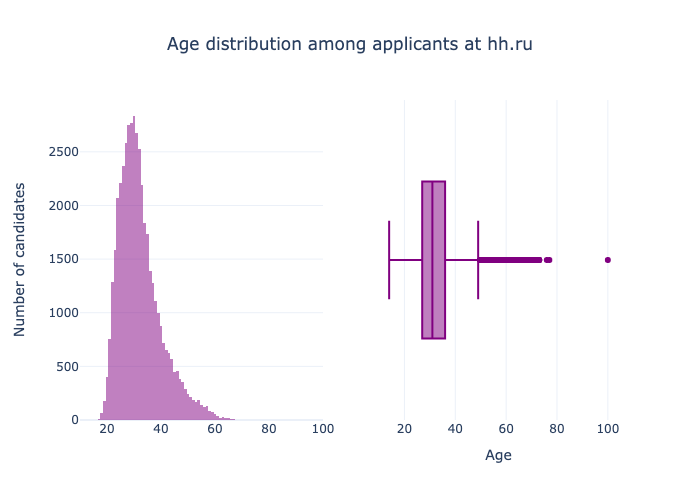

In [14]:
# set two subplots side by side
fig = make_subplots(rows=1, cols=2)

# add the histogram 
fig.add_trace(
    px.histogram(
        data_frame=hh_data,
        x="Возраст", 
        nbins=90,
        color_discrete_sequence=['purple'],
        opacity=0.5
    ).data[0],
    row=1, col=1
).update_layout(
    yaxis_title='Number of candidates',
    xaxis_range=[10, 100]
)

# add the  box plot 
fig.add_trace(
    px.box(
        data_frame=hh_data,
        x="Возраст",
        range_x=[10,100],
        color_discrete_sequence=['purple'],
    ).data[0],  
    row=1, col=2
)

fig.update_xaxes(title_text='Age', row=1, col=2)

fig.update_layout(
    title_text='Age distribution among applicants at hh.ru',
    title={'x':0.5},
    template='plotly_white'
)

fig.show()
fig.show("png")


The histogram and box plot above indicate that **the majority** of applicants fall **between the ages of 25 and 36**, with the **median age of 31** and the **mode age at 30**. The youngest candidate is 14 years old, while the oldest appears to be 100. However, this maximum age seems improbable and is likely an error. Excluding this anomaly reduces the maximum age to 77, which is more plausible. Consultants, tutors, mentors, freelancers and such can look for a job at any age, also there might be retirees seeking part-time, flexible work or volunteer their time. **The distribution of age resembles a lognormal, allowing use of Z-score or Tukey's methods for identifying outliers.**

2. Now we will explore the distribution of the feature **"Опыт работы (месяц)" (Work experience in months)** to answere the following questions: 

    * what is the mode of the distribution?
    * what are the extreme values of the feature?
    * in what approximate range is the age of the majority of applicants located?
    * are there any anomalies for the age feature, what values would you attribute to them?

*Tool: plot a histogram and a box plot side by side*.

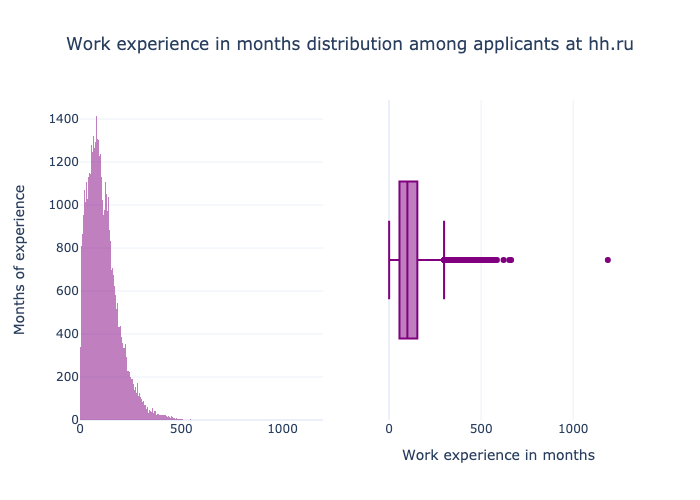

In [15]:
# set two subplots side by side
fig = make_subplots(rows=1, cols=2)

# add the histogram 
fig.add_trace(
    px.histogram(
        data_frame=hh_data,
        x="Опыт работы (месяц)", 
        color_discrete_sequence=['purple'],
        opacity=0.5
    ).data[0],
    row=1, col=1
).update_layout(
    yaxis_title='Months of experience',
    xaxis_range=[0, 1200]
)

# add the box plot 
fig.add_trace(
    px.box(
        data_frame=hh_data,
        x="Опыт работы (месяц)",
        range_x=[10,100],
        color_discrete_sequence=['purple'],
    ).data[0],  
    row=1, col=2
)

fig.update_xaxes(title_text='Work experience in months', row=1, col=2)

fig.update_layout(
    title_text='Work experience in months distribution among applicants at hh.ru',
    title={'x':0.5},
    template='plotly_white'
)

fig.show()
fig.show("png")

According to the histogram and the box plot above, **most applicants** have worked for** between 57 and 154 months**, with a **mode of 80-84 months** and a **median of 100 months**. The data includes some candidates starting their careers (0 months) and the maximum appers to be 1188 month (100 years) and is likely an error in the data. Removing this anomaly, the maximum experience is 663 months (slightly over 55 years), which is plausible for elder applicants. However, further investigation is needed for this and the neighboring values considering applicants' age. **The distribution of work experience resembles a lognormal, allowing use of Z-score or Tukey's methods for identifying outliers.**

3. Now let's plot the distribution of the **"ЗП (руб.)" (Salary, rub)** to establish the extreme values of the feature, determine the approximate range where the majority of applicants' salaries fall. Are there any anomalies in the salary feature?


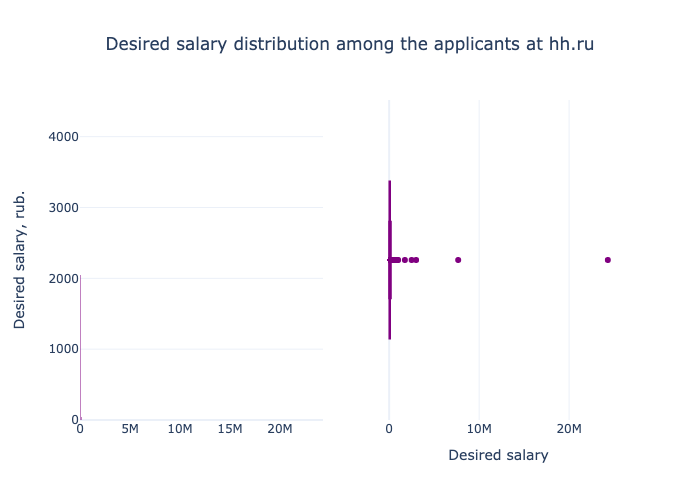

---


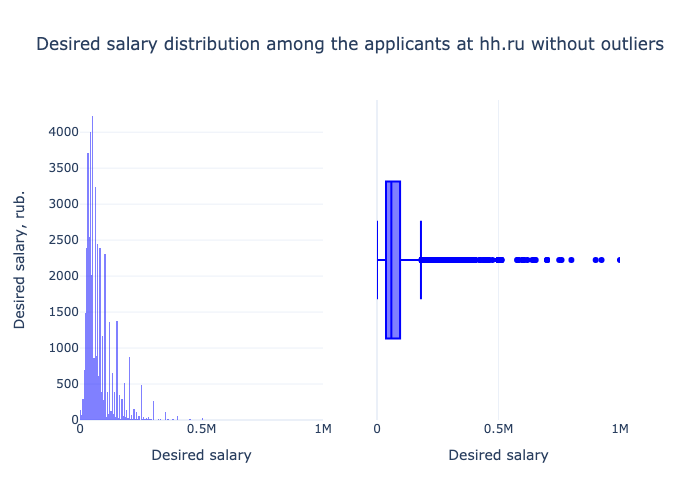

In [16]:
# set 2 subplots side by side
fig = make_subplots(rows=1, cols=2)

# add the histogram 
fig.add_trace(
    px.histogram(
        data_frame=hh_data,
        x="ЗП (руб.)", 
        color_discrete_sequence=['purple'],
        opacity=0.5
    ).data[0],
    row=1, col=1
).update_layout(
    yaxis_title='Desired salary, rub.',
)

# add the box plot 
fig.add_trace(
    px.box(
        data_frame=hh_data,
        x="ЗП (руб.)",
        color_discrete_sequence=['purple'],
    ).data[0],  
    row=1, col=2
)

fig.update_xaxes(title_text='Desired salary', row=1, col=2)

fig.update_layout(
    title_text='Desired salary distribution among the applicants at hh.ru',
    title={'x':0.5},
    template='plotly_white'
)

fig.show()
fig.show("png")

print('---')

#additional box plot for a better look at the distribution within 0-1000000 rub.

add_fig = make_subplots(rows=1, cols=2)

add_fig.add_trace(
    px.histogram(
        data_frame=hh_data,
        x="ЗП (руб.)", 
        color_discrete_sequence=['blue'],
        opacity=0.5
    ).update_traces(xbins=dict(start=0, end=1000000)).data[0],
    row=1, col=1
).update_layout(
    yaxis_title='Desired salary, rub.',
)

add_fig.add_trace(
    px.box(
        data_frame=hh_data,
        x="ЗП (руб.)",
        color_discrete_sequence=['blue'],
    ).data[0],  
    row=1, col=2
).update_xaxes(range=[0, 1000000], title_text='Desired salary')

# Update overall layout
add_fig.update_layout(
    title_text='Desired salary distribution among the applicants at hh.ru without outliers',
    title={'x':0.5},
    template='plotly_white'
)

# Show the figure
add_fig.show()
add_fig.show("png")

The original histogram and box plot indicate the **min and max values at 2,500 and 2,430,4880** roubles respectively. The maximum appears an unllikely high value. To provide a clearer perspective, we've generated a revised pair of charts with the salary value capped at a maximum of 1,000,000 rubles. That leaves out five measurments.

Within this range **the majority** of expected salaries **fall between 37,000 and 95,000 rubles**, with the **mode at 50,000 to 55,000 rubles**, and the **median of 59,000 rubles**. The are several values between 2,000,000 and 3,000,000 rub. that have been left out of of the charts, but they represent plausible salary expectations and need to be further investigated taking into account the roles being pursued and the experience level of the applicants to ensure the integrity of the data.  **The salary distribution is once again close to lognormal, allowing use of Z-score or Tukey's methods for identifying outliers.**

4. Next we will create a chart showing the **relationship** between the **median** desired salary (__"Desired salary (rub)"__) and the **level of education** ("Education") using data where the desired salary is less than 1 million rubles. This will help us determine which levels of education correspond to the highest and lowest desired salary levels and assess whether education is a reliable predictor of salary.

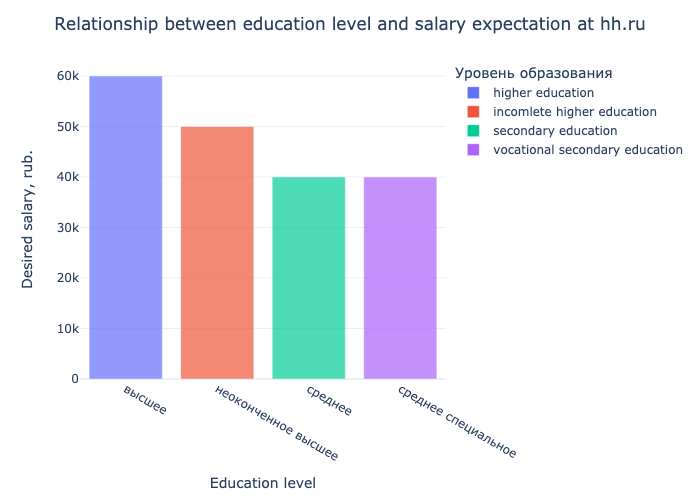

In [17]:
# set salary below 1000000 rub.
mask_salary = hh_data['ЗП (руб.)'] < 1000000

# group median salary data by education level
salary_vs_education_data = hh_data[mask_salary].groupby(by='Уровень образования', as_index=False)['ЗП (руб.)'].median()

#plot the bar chart
fig = px.bar(
    data_frame=salary_vs_education_data,
    y='ЗП (руб.)',
    x='Уровень образования',
    color='Уровень образования',
    opacity=0.7
).update_layout(
    title_text='Relationship between education level and salary expectation at hh.ru',
    title={'x':0.5},
    template='plotly_white',
    yaxis_title='Desired salary, rub.',
    xaxis_title='Education level'
)

# translate legend categories to English
fig.update_traces({'name': 'higher education'}, selector={'name': 'высшее'})
fig.update_traces({'name': 'incomlete higher education'}, selector={'name': 'неоконченное высшее'})
fig.update_traces({'name': 'secondary education'}, selector={'name': 'среднее'})
fig.update_traces({'name': 'vocational secondary education'}, selector={'name': 'среднее специальное'})


fig.show()
fig.show("png")


The bar graph above illustrates that applicants with **higher education** tend to expect **higher salaries** with the median of 60,000 rub., whereas those with **secondary or vocational secondary education** have the **lowest salary** expectations both at the median of 40,000 rub.. Aplicants with incomplete degrees are in the middle with the median of 50,000 rub.. This data suggests a correlation between education level and salary expectations, indicating that **education level may be a relevant predictor of salary**. 

5. Next we will plot a diagram that shows the distribution of desired salaries (**"ЗП (руб)"**) for 4 categories of cities (**"Город"**), namely Moscow, Saint Petersburg, cities with above 1,000,000 residents and others, using data where the desired salary is less than 1 million rubles. It will demonstrate how the median levels of desired salary relate to cities, and help us establish the importance of the city attribute in predicting salary.

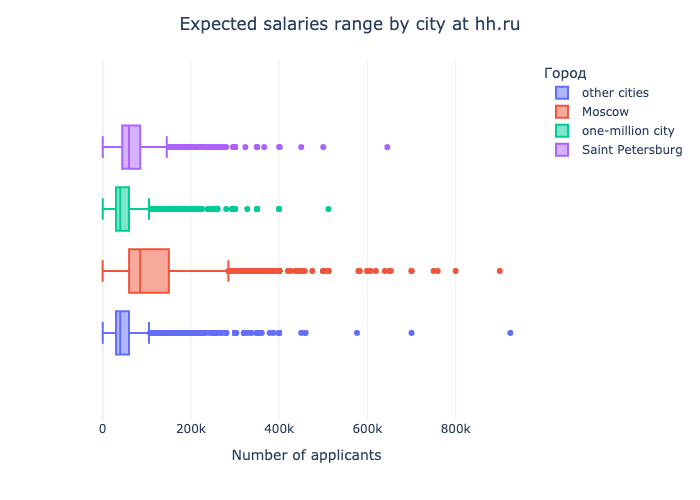

In [18]:
# add the box plot
fig = px.box(
    data_frame=hh_data[mask_salary],
    x='ЗП (руб.)',
    color='Город'
).update_layout(
    title_text='Expected salaries range by city at hh.ru',
    title={'x':0.5},
    template='plotly_white',
    xaxis_title='Number of applicants'
)

# translate the legend categories to English
newnames = {
    'другие':'other cities', 
    'Москва': 'Moscow', 
    'Санкт-Петербург':'Saint Petersburg',
    'город-миллионник': 'one-million city'
    }

fig.for_each_trace(lambda t: t.update(name = newnames[t.name]))

fig.show()
fig.show("png")


The box plot above reveals notable differences in median expected salaries among cities in rubles. **Moscow** leads with a **median salary of 85,000**, followed by **Saint Petersburg at 60,000**. **Other cities** rank lower, with a **median salary of 40,000**. Interestingly, Moscow shows the widest range of desired salaries, with most falling between 60,000 and 150,000, while in Saint Petersburg, the range is narrower, from 44,286 to 85,000. For other cities, the range is  from 30,000 to 60,000. Moreover, Moscow also has the highest minimum and maximum values, followed by Saint Petersburg and only then by other cities. These findings suggest that **'city'** could serve as a useful attribute **for categorizing salaries in Russia into three distinct groups: Moscow, Saint Petersburg, and all other cities.**

6. As follows, we will use a **multi-level bar chart**, that shows the dependence of the median salary **("ЗП (руб)**") on features **"Готовность к переезду" (Willingness to relocate)** and **"Готовность к командировкам" (Willingness to go on business trips)** to analyze the salary levels in the two categories."

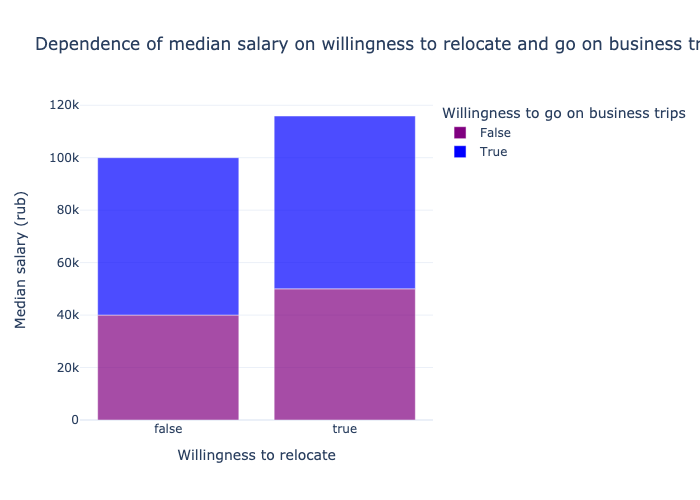

In [19]:
# group salary data by willingness to relocate and to travel
salary_relocation_trips_data = hh_data.groupby(
    by=['Готовность к переезду', 'Готовность к командировкам'], as_index=False
    )['ЗП (руб.)'].median()

# plot the bar graph
fig = px.bar(
    data_frame = salary_relocation_trips_data, 
    x='Готовность к переезду', 
    y='ЗП (руб.)', 
    color='Готовность к командировкам',
    title='Dependence of median salary on willingness to relocate and go on business trips',
    labels={'Готовность к переезду': 'Willingness to relocate', 'ЗП (руб.)': 'Median salary (rub)'},
    color_discrete_sequence=['purple', 'blue'],
    opacity = 0.7
 ).update_layout(
    template='plotly_white',
    legend_title_text='Willingness to go on business trips'
)



    
fig.show()
fig.show("png")

The multi-level bar graph above illustrates the median salary expectations based on applicants' willingness to relocate and go on business trips. Applicants who are **not willing to relocate nor go on business** trips have the lowest median salary expectation, at **40,000 rubles**. Those who are **only willing to relocate** have a slightly higher median salary expectation of **50,000 rubles**. Candidates **ready to travel but not relocate** seek a median salary of **60,000 rubles**. Finally, applicants willing to **both relocate and travel** expect a median salary of **65,900 rubles**.
These findings suggest that willingness to relocate or go on business trips individually may result in higher salary expectations, with the highest expectations observed when both factors are combined.

7. Next we will create a pivot table illustrating the relationship between the **median desired salary** and both **age ("Возраст")** and **education level ("Уровень образования")**. Then, we will visualize this pivot table using a heatmap to compare the indicators within the groups.

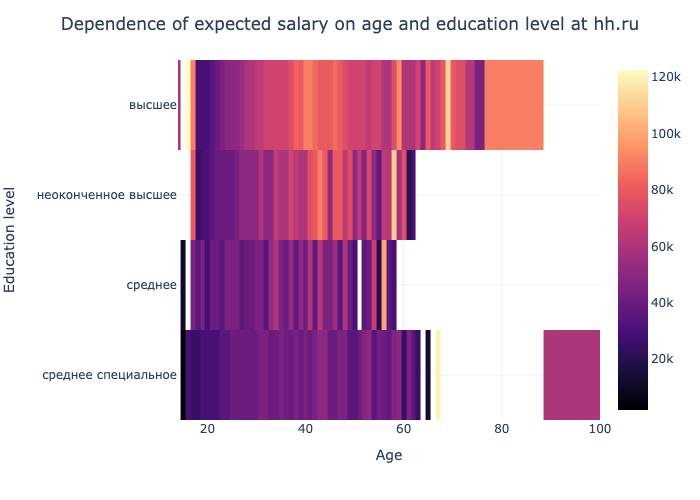

In [20]:
# create a pivot table with education level, age and median salary
salary_age_education = hh_data.pivot_table(
    index='Уровень образования',
    columns='Возраст', 
    values='ЗП (руб.)', 
    aggfunc='median'
)

# plot the heatmap
fig= px.imshow(
    salary_age_education,
    color_continuous_scale='magma'
).update_layout(
    title_text='Dependence of expected salary on age and education level at hh.ru',
    title={'x':0.5},
    xaxis_title='Age',  # Changed to xaxis_title
    yaxis_title='Education level',  # Changed to yaxis_title,
    xaxis_range=[14, 100],
    template='plotly_white'
)

fig.show()
fig.show("png")

The heatmap above reveals that candidates with a degree anticipate higher salary prospects, which tend to increase with age. They are consistently followed by individuals with incomplete higher education; however, after reaching the age of 60, their salary expectations decrease to entry-level rates. Interestingly, individuals with secondary education demonstrate marginally higher salary expectations compared to those with vocational secondary education, despite the latter being traditionally considered superior.

Notably, the visualization also uncovers potential data anomalies. Several candidates reported having a higher education level at an age below 20 years, a scenario highly improbable in Russia. These same candidates also anticipate the highest entry-level salaries. If we were to exclude these observations from the dataset, we would observe that candidates with a degree expect salaries at the beginning of their careers more in line with those in other education levels.

8. Next in line is a scatter plot illustrating the **relationship between work experience ("Опыт работы (месяц)") and age ("Возраст")**. To ensure uniformity of features we will convert work experience from months to years.  Additionaly, we will plot a straight line passing through points (0, 0) and (100, 100) on the graph. This line indicates the values when work experience equals to the person's age. Points lying on this line and above it are anomalies in our data (work experience greater than or equal to the applicant's age). 

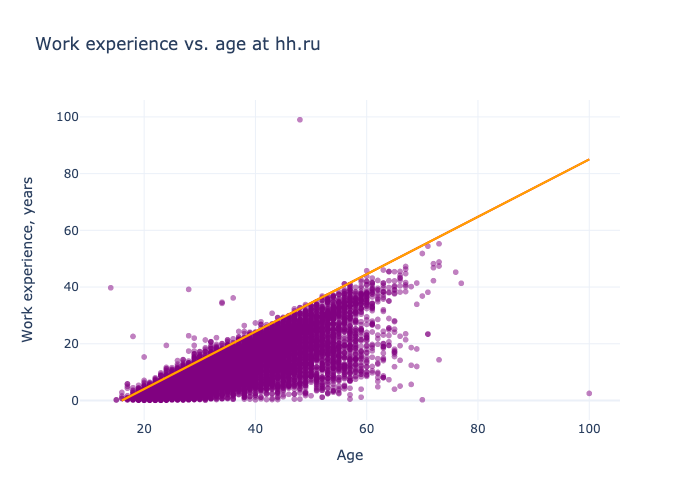

In [21]:
# create a new feature 'Work experience, years'
hh_data['Опыт работы (год)'] = hh_data['Опыт работы (месяц)'] / 12

fig = px.scatter(
    data_frame=hh_data,
    x='Возраст',
    y='Опыт работы (год)',
    color_discrete_sequence=['purple'],
    opacity=0.5,
    title='Work experience vs. age at hh.ru',
    labels={'Опыт работы (год)': 'Work experience, years', 'Возраст': 'Age'},
    template='plotly_white'
)

#set min age to start working as 0 y. o 
fig.add_shape(type='line', x0=16, y0=0, x1=100, y1=85, line=dict( color="red", width=2 ))


# set min age to start working as 16 y.o.
fig.add_shape(type='line', x0=16, y0=0, x1=100, y1=85, line=dict( color="orange", width=2 ))


fig.show()
fig.show("png")

The scatter plot above illustrates the correlation between applicants' age and their work experience in years. **The red line cuts off 7 applicants whose work experience is equal or surpasses their age**. For additional clarity  **the orange line serves as a threshold, highlighting candidates whos work experience exceeds what is typically expected for their age group**. For instance, it helps identify anomalies such as a 26-year-old applicant claiming over 12 years of experience, which is improbable in Russia where one usually begins working not earlier then they turn 16.

### Additional exploratory analysis 1

First, we will plot a bar graph to estimate the correlation between the **salary** and the applicants' **gender**.

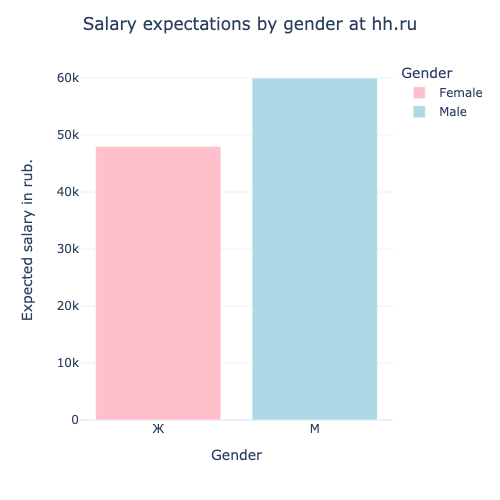

In [22]:
# group median data on expected salary  by gender
gender_data = hh_data.groupby('Пол', as_index=False)['ЗП (руб.)'].median()

# plot the graph
fig = px.bar(
    gender_data,
    x='Пол',
    y='ЗП (руб.)',
    color='Пол',
    color_discrete_map={"М": "lightblue", "Ж": "pink"},
    width=500,
    template='plotly_white'
).update_layout(
    title_text='Salary expectations by gender at hh.ru',
    title={'x':0.5},
    legend_title='Gender',
    xaxis_title='Gender',
    yaxis_title='Expected salary in rub.'
)

fig.update_traces({'name': 'Female'}, selector={'name': 'Ж'})
fig.update_traces({'name': 'Male'}, selector={'name': 'М'})

fig.show()
fig.show("png")


The colored-coded bar graph above indicates that **median expected saly for men is 25% higher than for women** at 60,000 and 48,000 rub. respectively.

### Additional exploratory analysis 2

Finally, we will create a bar chart to explore the correlation between education level and the type of employment (full time or part time).

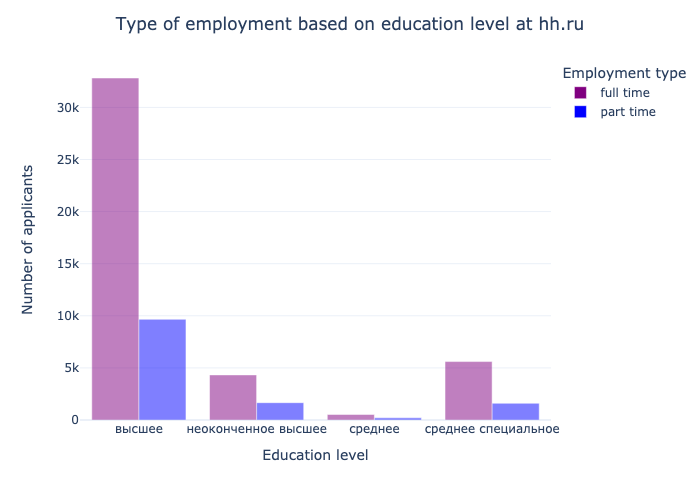

In [23]:

education_employment_data = hh_data.groupby(
    by='Уровень образования', as_index=False)[['полная занятость', 'частичная занятость']].sum()


fig = px.bar(
    data_frame=education_employment_data,
    x='Уровень образования',
    y=['полная занятость', 'частичная занятость'],
    color_discrete_map={"полная занятость": "purple", "частичная занятость": "blue"},
    opacity=0.5,
    barmode='group'
).update_layout(
    title_text='Type of employment based on education level at hh.ru',
    title={'x':0.5},
    xaxis_title='Education level',
    yaxis_title='Number of applicants',
    legend_title='Employment type',
    template='plotly_white'
)

fig.update_traces({'name': 'full time'}, selector={'name': 'полная занятость'})
fig.update_traces({'name': 'part time'}, selector={'name': 'частичная занятость'})


fig.show()
fig.show("png")

The bar graph above indicates that across all education levels, there is a higher preference for full-time employment compared to part-time employment. This suggests that most applicants are seeking stable and full-time positions. 

Furthermore, the number of candidates with higher education is significantly greater than those without it. This indicates a prevalent trend in Russia where individuals tend to pursue higher education before entering the job market, which can be explained by the fact that most employers put higher education as a requirement as an indicator of the candidate dedication, responsibility, and persistence, regarfless of the specific job role. Consequently, pursuing higher education is perceived as a crucial step towards enhancing employability and meeting the expectations of the labor market.

# "Data cleaning"

1. First, we will find exact duplicates in the resume table and remove them.

In [24]:
# find duplicates
hh_duplicates = hh_data[hh_data.duplicated(subset=hh_data.columns)]
print(f'Duplicates found: {hh_duplicates.shape[0]}')

# remove duplicates
hh_data = hh_data.drop_duplicates()
print(f'Number of observations left: {hh_data.shape[0]}')

Duplicates found: 158
Number of observations left: 44586


2. Now we will handle the missing values. First, we will obtain information about the number of missing values in each column.

In [25]:
hh_data.isnull().sum()


Ищет работу на должность:            0
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Обновление резюме                    0
Авто                                 0
Уровень образования                  0
Пол                                  0
Возраст                              0
Опыт работы (месяц)                168
Город                                0
Готовность к переезду                0
Готовность к командировкам           0
полная занятость                     0
частичная занятость                  0
проектная работа                     0
волонтерство                         0
стажировка                           0
полный день                          0
сменный график                       0
гибкий график                        0
удалённая работа                     0
вахтовый метод                       0
ЗП (руб.)                            0
Опыт работы (год)                  168
dtype: int64

3. So, there are missing values in 3 columns: **"Опыт работы (месяц)" (Work Experience in months)**, **"Последнее/нынешнее место работы" (Last/Current Place of Work)**, and **"Последняя/нынешняя должность" (Last/Current Position)**. We will now  delete the rows where there are missing values in the columns related to place of work and position and fill in missing values in the work experience column with the median value. 

In [26]:
# find and remove observations with missing data for wrok experience details
mask_missing_exp = (hh_data['Последнее/нынешнее место работы'].isnull()) & (hh_data['Последняя/нынешняя должность'].isnull())
hh_data = hh_data[~mask_missing_exp]

# fill in the missing values in total experience
values = {'Опыт работы (месяц)': hh_data['Опыт работы (месяц)'].median()}
hh_data.fillna(values)

print(f'Mean work experience, months: {round(hh_data['Опыт работы (месяц)'].mean())}')


Mean work experience, months: 114


4. We've reached the stage of handling outliers. Let's start by manually **removing the CVs where the salary is either above 1,000,000  or below 1,000 rubles**.

In [27]:
mask_salary_range = (hh_data['ЗП (руб.)']<1000) | (hh_data['ЗП (руб.)']>1000000)
print(f'Salary out of range [1000, 1000000]: {hh_data[mask_salary_range].shape[0]}')

hh_data = hh_data[~mask_salary_range]


Salary out of range [1000, 1000000]: 89


5. During exploratory analysis, we discovered CVs where **work experience in years exceeded the applicant's age**. We will find and remove them from the dataset. 

In [28]:
mask_too_much_experience = hh_data['Опыт работы (год)']  >= hh_data['Возраст']
print(f'Work experience equal or superior to age: {hh_data[mask_too_much_experience].shape[0]}')

hh_data = hh_data[~mask_too_much_experience]

Work experience equal or superior to age: 7


### alternative path

If I were to follow my previoues statment from the explorative analysis that people in Russia are unlikely to start working before they turn 16, the result would be as follows

In [29]:
mask_workers_below_16 = hh_data['Опыт работы (год)'] + 16 >= hh_data['Возраст']
print(f'Work experience started before 16 y.o.: {hh_data[mask_workers_below_16].shape[0]}')

hh_data = hh_data[~mask_workers_below_16]

Work experience started before 16 y.o.: 353


6. During the analysis, we discovered **potential outliers in the "Возраст" (Age)** feature. These turned out to be CVs of people of excessively advanced age for job search. We will plot the distribution of the feature in logarithmic scale and add lines to the plot representing the mean and the boundaries of the **three-sigma method** interval. It will allow us to see in which direction is the logarithmic distribution asymmetric.

Then we will find outliers using the z-score method and remove them from the data, using logarithmic scale. We will set the threshold to 4*sigma (take 4 sigmas) to the right side and evaluate what age group of applicants falls under the category of outliers.

The distribution is right-skewed.
Number of ouliers found: 1


,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Уровень образования,Пол,Возраст,Опыт работы (месяц),Город,...,волонтерство,стажировка,полный день,сменный график,гибкий график,удалённая работа,вахтовый метод,ЗП (руб.),Опыт работы (год),Age_log
33654,Frontend-разработчик,Freelance,Frontend-разработчик,19.04.2019 23:27,Не указано,среднее специальное,М,100,30.0,Санкт-Петербург,...,False,True,True,False,True,False,False,60000.0,2.5,4.60517


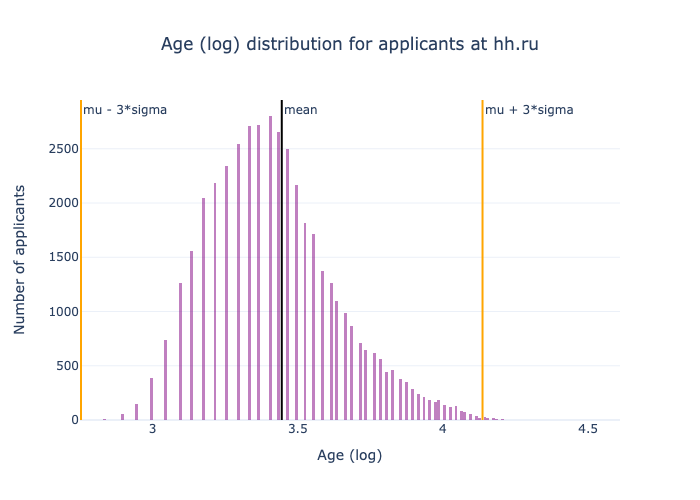

In [30]:
mu, lower_bound, higher_bound = find_z_score_parameters(hh_data, 'Возраст', True)

hh_data['Age_log'] = np.log(hh_data['Возраст'])

fig = px.histogram(
    data_frame=hh_data,
    x='Age_log',
    title='Age (log) distribution for applicants at hh.ru',
    color_discrete_sequence=['purple'],
    opacity=0.5,
    template='plotly_white',
).update_layout(
    title={'x':0.5},
    xaxis_title = 'Age (log)',
    yaxis_title = 'Number of applicants'
)

fig.add_vline(x=hh_data['Age_log'].mean(), line=dict(color='black', width=2), annotation_text='mean')
fig.add_vline(x=lower_bound, line=dict(color='orange', width=2), annotation_text='mu - 3*sigma')
fig.add_vline(x=higher_bound, line=dict(color='orange', width=2), annotation_text='mu + 3*sigma')

outliers, cleaned = outliers_z_score_mod(hh_data, 'Возраст', log_scale=True, right=4)

if hh_data['Age_log'].mean() < hh_data['Age_log'].median() < hh_data['Age_log'].mode()[0]:
    print("The distribution is left-skewed.")
elif hh_data['Age_log'].mode()[0] < hh_data['Age_log'].median() < hh_data['Age_log'].mean():
    print("The distribution is right-skewed.")
else:
    print("The distribution is approximately symmetric.")


print(f'Number of ouliers found: {outliers.shape[0]}')
display(outliers)

fig.show()
fig.show("png")

The age log distribution is skewed to the right, the only outlier found using the z-score method is registred as being 100 y.o.

P.S. I got 158 duplicates, so I imagine that's why I have 1 outlier instead of 3, as in the answers.